In [4]:
import os
import random

import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200
from ssl_project.data_loaders import plot_utils

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision

from ssl_project.data_loaders.data_helper import UnlabeledDataset, LabeledDataset
from ssl_project.data_loaders.helper import collate_fn, draw_box

In [5]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0);

In [6]:
# All the images are saved in image_folder
# All the labels are saved in the annotation_csv file
image_folder = 'data'
annotation_csv = 'data/annotation.csv'

In [7]:
# You shouldn't change the unlabeled_scene_index
# The first 106 scenes are unlabeled
unlabeled_scene_index = np.arange(106)
# The scenes from 106 - 133 are labeled
# You should devide the labeled_scene_index into two subsets (training and validation)
labeled_scene_index = np.arange(106, 134)

# Load labeled dataset

In [9]:
transform = torchvision.transforms.ToTensor()

# The labeled dataset can only be retrieved by sample.
# And all the returned data are tuple of tensors, since bounding boxes may have different size
# You can choose whether the loader returns the extra_info. It is optional. You don't have to use it.
labeled_trainset = LabeledDataset()
trainloader = torch.utils.data.DataLoader(labeled_trainset, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)

In [10]:
sample, target, road_image, extra = labeled_trainset[5]
sample.shape

torch.Size([6, 3, 256, 306])

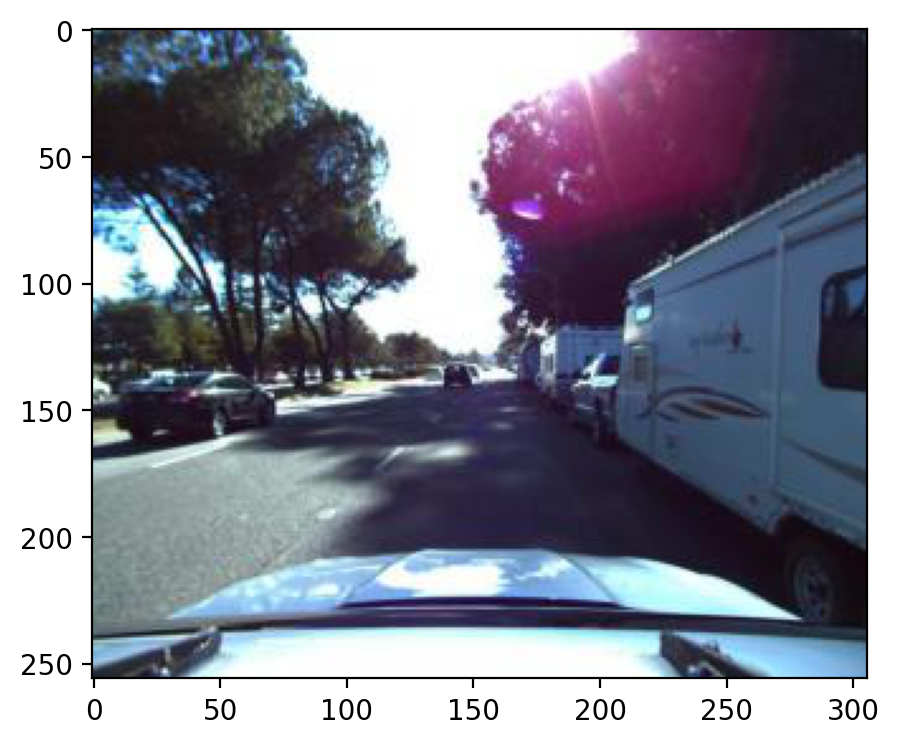

In [11]:
plot_utils.plot_photos(sample[1])

In [12]:
car_idces = np.arange(25) # [7]#,9, 16,17,18]

In [13]:
road_image

tensor([[False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        ...,
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False],
        [False, False, False,  ..., False, False, False]])

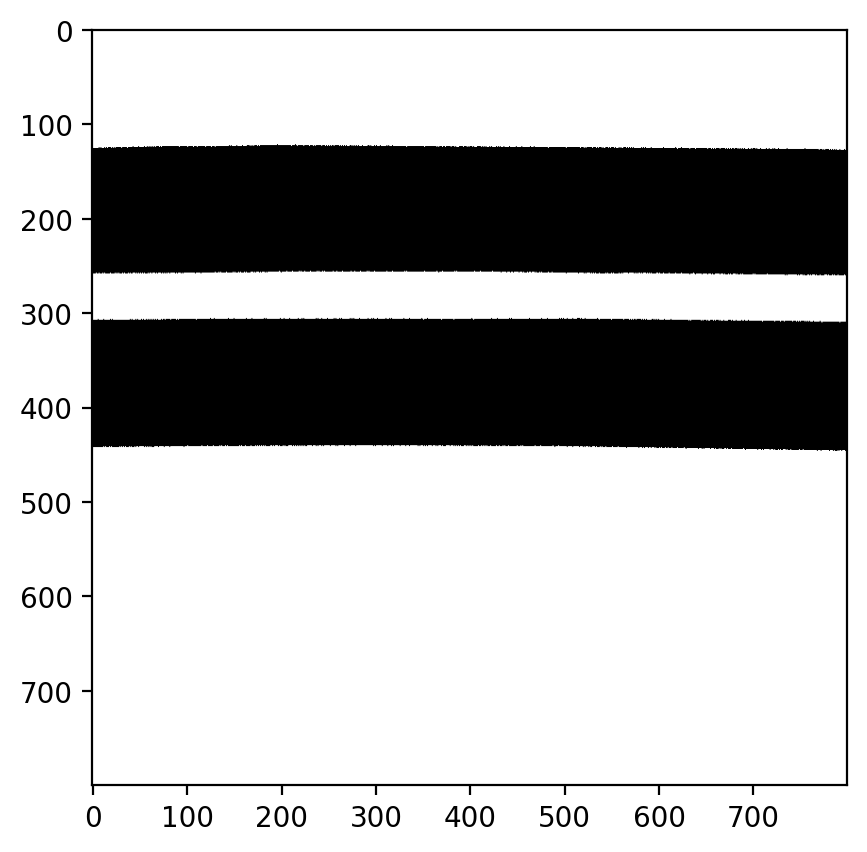

In [14]:
plot_utils.plot_road(road_image)

In [15]:
# Ego Image
# A more detailed ego image

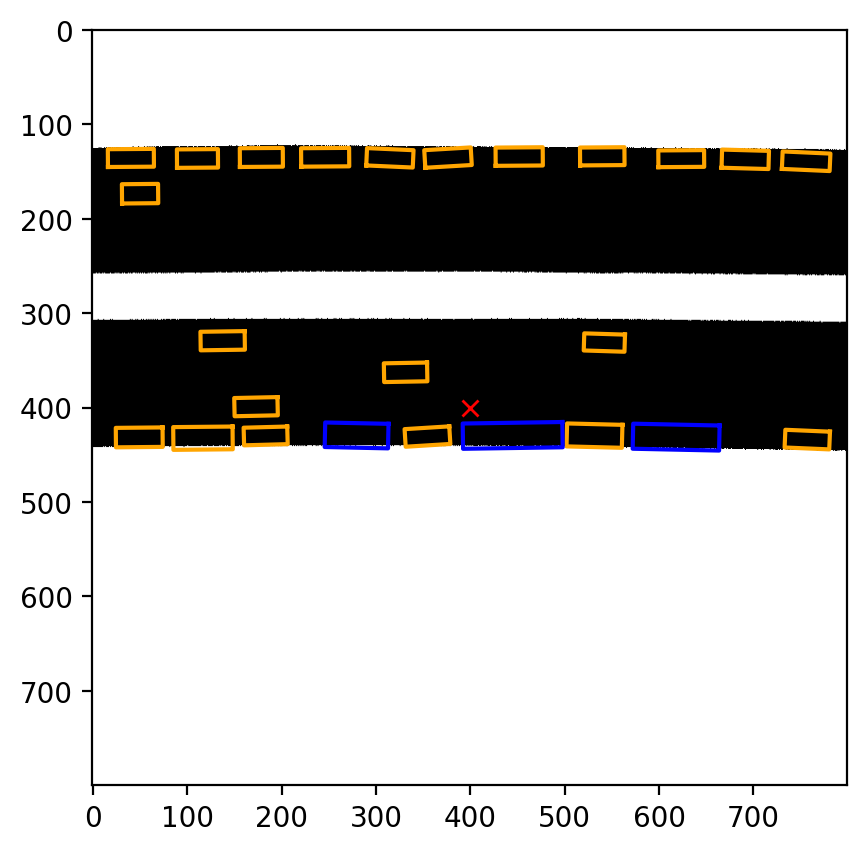

In [16]:
plot_utils.plot_bb(road_image, target)

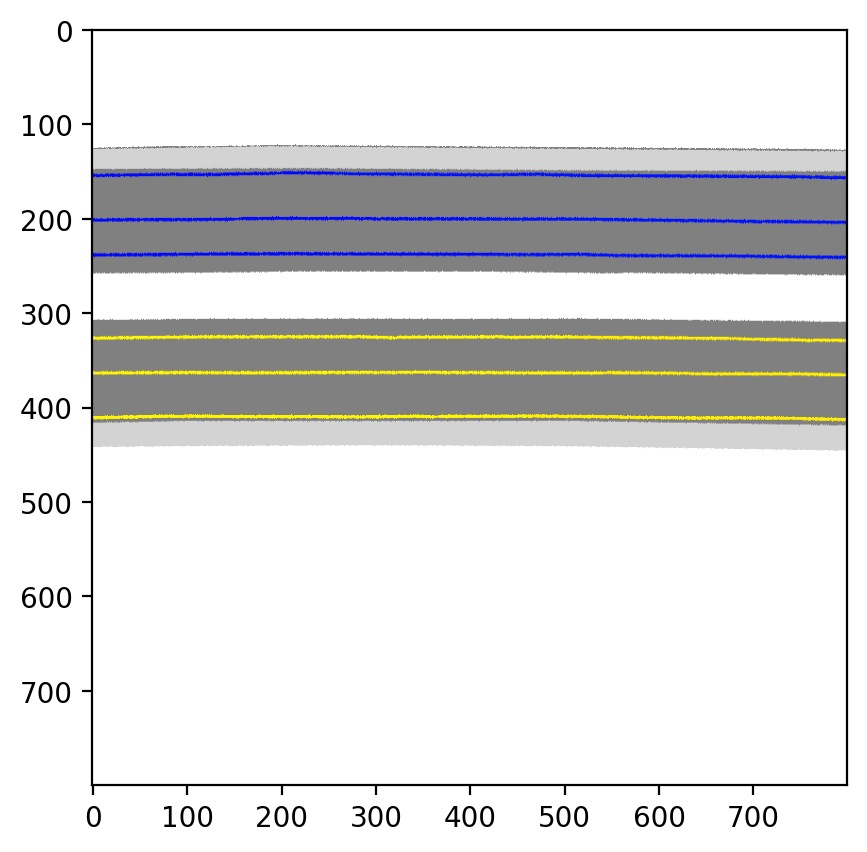

In [17]:
fig, ax = plt.subplots()
ax.imshow(extra['ego_image'].numpy().transpose(1, 2, 0));

In [ ]:
HEIGHT = 17
VIEW_POINT = np.array([0, 0, HEIGHT])
alpha = np.radians(70)
dist = 1

from sklearn.linear_model import LinearRegression

class Corners:
    def __init__(self, camera_height_in_m, alpha, level_height_in_m=0, *,
                 image_dims=(306, 256)):
        """
        Assumes dist to projection plane is 1.
        
        height = horizontal plane (e.g. road) height
        """
        assert level_height_in_m < camera_height_in_m
        
        self.camera_height  = camera_height_in_m * 10
        self.angle_view     = np.radians(alpha)
        self.level_height    = level_height_in_m * 10
        
        self.image_width, self.image_height = image_dims
        
        self.view_point = np.array([0, 0, self.camera_height])
        
        self._f_xyz_to_camera_plane = projection_func(
            self.view_point,
            np.array([1, 0, 0,]),
            np.array([1, 0, 0,]),
        )

        self._f_camera_to_xy_h = projection_func(
            self.view_point,
            np.array([0, 0, self.level_height]),
            np.array([0, 0, 1,]),
        )
    

    def _scale(self, yz_42):
        new_yz_42 = yz_42.copy()
        new_yz_42[..., 0] = self._y_axis_transform.predict(yz_42[..., 0:1])
        new_yz_42[..., 1] = self._z_axis_transform.predict(yz_42[..., 1:2])

        return new_yz_42


    def get_photo_and_map_corners(self):
        """Returns photo_corners_43, map_corners_43"""
        photo_down_corners_23 = self._get_photo_down_corners()
        map_back_corners_23  = self._get_map_back_corners()
        photo_up_corners_23  = self._get_photo_up_corners(map_back_corners_23)
        map_front_corners_23 = self._get_map_front_corners(photo_down_corners_23)
        
        tmp_photo_corners_43, tmp_map_corners_43 = (
            np.vstack([photo_down_corners_23, photo_up_corners_23]), 
            np.vstack([map_front_corners_23, map_back_corners_23]),
        )
        
        photo_corners_yz_42 = self._scale(tmp_photo_corners_43[:, 1:])
        map_corners_xy_42 = tmp_map_corners_43[:, :2] + 400
        return photo_corners_yz_42.astype(int), map_corners_xy_42.astype(int)

    def _get_photo_down_corners(self, dist_to_plane=1):
        y_diff = np.tan(self.angle_view / 2) * dist_to_plane
        z_diff = y_diff * self.image_height / self.image_width
    
        def get_linear_tansform(x1, x2, new_x1, new_x2):
            lr = LinearRegression()
            lr.fit([[x1], [x2]], [new_x1, new_x2])
            return lr

    
        self._y_axis_transform = get_linear_tansform(
            - y_diff, y_diff, 0, self.image_width)
        self._z_axis_transform = get_linear_tansform(
            self.camera_height + z_diff, 
            self.camera_height - z_diff, 
            0, self.image_height)
    
        return np.array([
            [1, - y_diff, self.camera_height - z_diff],
            [1, + y_diff, self.camera_height - z_diff],
        ])

    def _get_map_back_corners(self):
        dist_far = 400 # dist from center to border
        y_diff = np.tan(self.angle_view / 2) * dist_far
        return np.array([
            [dist_far, - y_diff, self.level_height],
            [dist_far, + y_diff, self.level_height],
        ])

    def _get_photo_up_corners(self, map_back_corners_23):
        return self._f_xyz_to_camera_plane(map_back_corners_23)

    def _get_map_front_corners(self, photo_down_corners_23):
        return self._f_camera_to_xy_h(photo_down_corners_23)

import cv2
import matplotlib.cm as cm

from ssl_project import constants
from importlib import reload

reload(constants)

from ssl_project.preprocessing import top_down_segmentation

reload(top_down_segmentation)

import numpy as np

GROUND_CAT = 13
assert top_down_segmentation.VALUE_TO_CATEGORY[GROUND_CAT] == 'ground'


def rotate_image(image, angle):
    image_center = tuple(np.array(image.shape[1::-1]) / 2)
    rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
    result  = cv2.warpAffine(image, rot_mat, image.shape[1::-1], 
                             flags=cv2.INTER_NEAREST, borderValue=GROUND_CAT)
    return result

In [381]:
sample_id = 1
photo = cv2.imread(f"../data/scene_106/sample_{sample_id}/CAM_FRONT.jpeg", cv2.IMREAD_UNCHANGED)
mask = cv2.imread(f"../data/scene_106/sample_{sample_id}/top_down_segm.png", cv2.IMREAD_UNCHANGED)

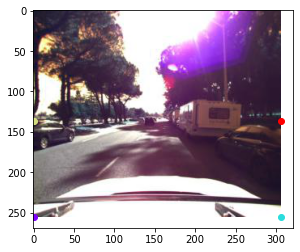

In [382]:
plt.imshow(photo)
# plt.scatter(photo_corners_43[:, 0], photo_corners_43[:, 1])
colors = cm.rainbow(np.linspace(0, 1, 4))

for (x, y), c in zip(photo_corners_yz_42, colors):
    plt.scatter(x, y, color=c)

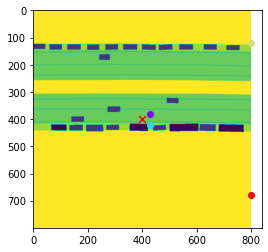

In [383]:
plt.imshow(mask)
# plt.scatter(photo_corners_43[:, 0], photo_corners_43[:, 1])
colors = cm.rainbow(np.linspace(0, 1, 4))

for (x, y), c in zip(map_corners_xy_42, colors):
    plt.scatter(x, y, color=c)
    
plt.scatter([400], [400], color='r', s =45, marker='x')

In [556]:
def get_warped(
        segm_WW, height_WW, 
        photo_idx=1, level_height_in_m=0,
        camera_height_in_m = 1.7):
    
    segm_WW = rotate_image(segm_WW, -constants.IDX_TO_ANGLE[photo_idx])
    
    if level_height_in_m > camera_height_in_m:
        level_height_in_m_fake = 2 * camera_height_in_m - level_height_in_m
        inverse = True
    else:
        level_height_in_m_fake = level_height_in_m
        inverse = False
    
    corners = Corners(camera_height_in_m=camera_height_in_m, 
                      alpha=70, level_height_in_m=level_height_in_m_fake)
    photo_corners_yz_42, map_corners_xy_42 = corners.get_photo_and_map_corners()

    
    points_src, points_tgt = map_corners_xy_42.astype("float32"), photo_corners_yz_42.astype("float32")
    h_size = int(points_tgt[0, 1] - points_tgt[-1, 1])

    M = cv2.getPerspectiveTransform(points_src, points_tgt)
    
    def get_warped_image(image_WW):
        return cv2.warpPerspective(image_WW[:, ::-1], M, (306, h_size), flags=cv2.INTER_NEAREST).astype(int)
    
    warped_segm    = get_warped_image(segm_WW)
    warped_height  = get_warped_image(height_WW)
    
    warped_segm[warped_height < level_height_in_m] = -1
    answer_hw = np.full((256, 306), -1)
    answer_hw[256 - h_size:] = warped_segm[::-1, ::-1]
    
    return answer_hw[::-1] if inverse else answer_hw

In [557]:
plt.rcParams["figure.figsize"] = (16, 10)

# example of bad data

use idx == 4, sample id 70 to 90:

for fast car shadow superseeds the car.

for still cars it's ok or a bit behind (as now we are moving)

In [615]:
sample_id = 120

name = 'CAM_FRONT'
photo_hw = cv2.imread(f"../data/scene_{scene_id}/sample_{sample_id}/{name}.jpeg", cv2.IMREAD_UNCHANGED)
top_down_segm_WW = cv2.imread(f"../data/scene_{scene_id}/sample_{sample_id}/top_down_segm.png", cv2.IMREAD_UNCHANGED)
#     mask = np.roll(mask, -10, axis=1)
# segm_hw  = get_warped(rotate_image(mask, -angle))

In [616]:
reload(constants)

<module 'ssl_project.constants' from '/home/marina/Documents/DL/project/ssl_project/constants.py'>

In [617]:

def create_height_WW(segm_WW):
    height_WW = np.zeros_like(segm_WW)
    for val, category in top_down_segmentation.VALUE_TO_CATEGORY.items():
        if category in constants.CATEGORY_TO_HEIGHT:
            height = constants.CATEGORY_TO_HEIGHT[category]
            height_WW[segm_WW == val] = height

    return height_WW

In [618]:
dist_WW = np.zeros((800, 800))
dist_WW += ((np.arange(800) - 400)**2)[None]
dist_WW += ((np.arange(800) - 400)**2)[:, None]
dist_WW /= 100
dist_WW = np.sqrt(dist_WW)

In [619]:
height_WW = create_height_WW(top_down_segm_WW)

In [620]:
def create_segm_hw(top_down_segm_WW, height_WW):
    segm_hw     = get_warped(top_down_segm_WW, height_WW, 1, 0)

    for height in np.arange(0.1, height_WW.max(), 0.05):
        tmp_hw     = get_warped(top_down_segm_WW, height_WW, 1, height)
        np.copyto(segm_hw, tmp_hw, where=(tmp_hw != -1))

    return segm_hw

In [624]:
dist_hw = create_segm_hw(dist_WW, height_WW)
segm_hw = create_segm_hw(top_down_segm_WW, height_WW)

<IPython.core.display.Javascript object>


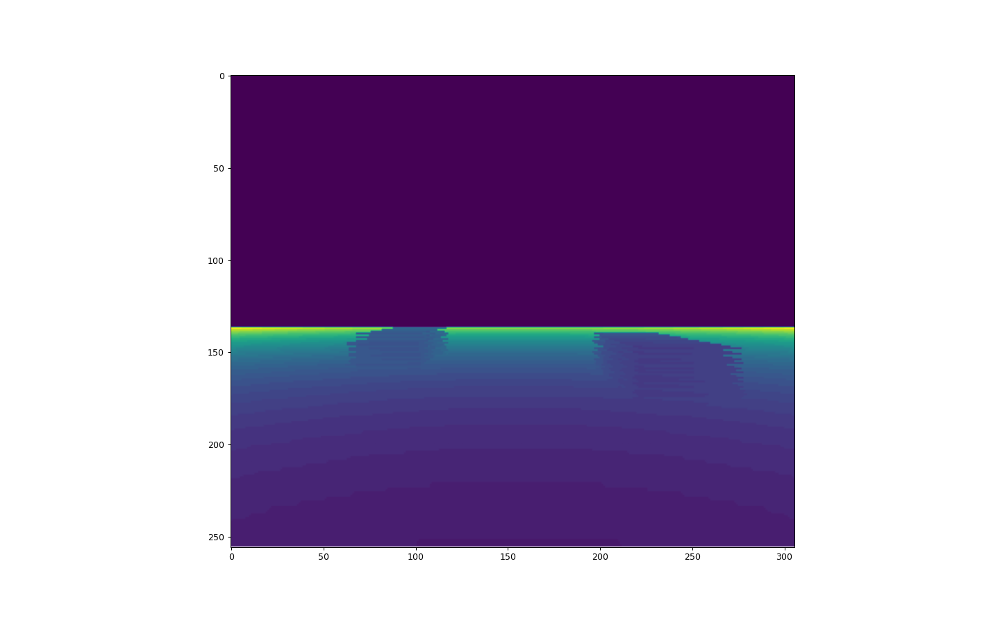

In [625]:
fig, axis = plt.subplots(1, 1)
axis.imshow(dist_hw)

<IPython.core.display.Javascript object>


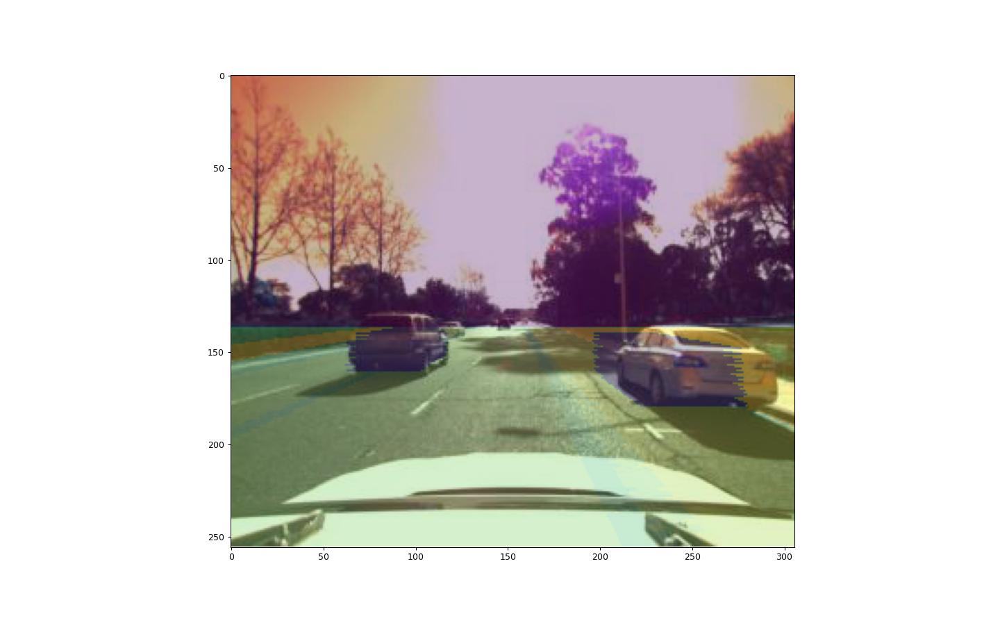

In [626]:
fig, axis = plt.subplots(1, 1)
axis.imshow(photo_hw)
# axis.imshow(dist_hw, alpha=0.3)
axis.imshow(segm_hw, alpha=0.3)

<IPython.core.display.Javascript object>


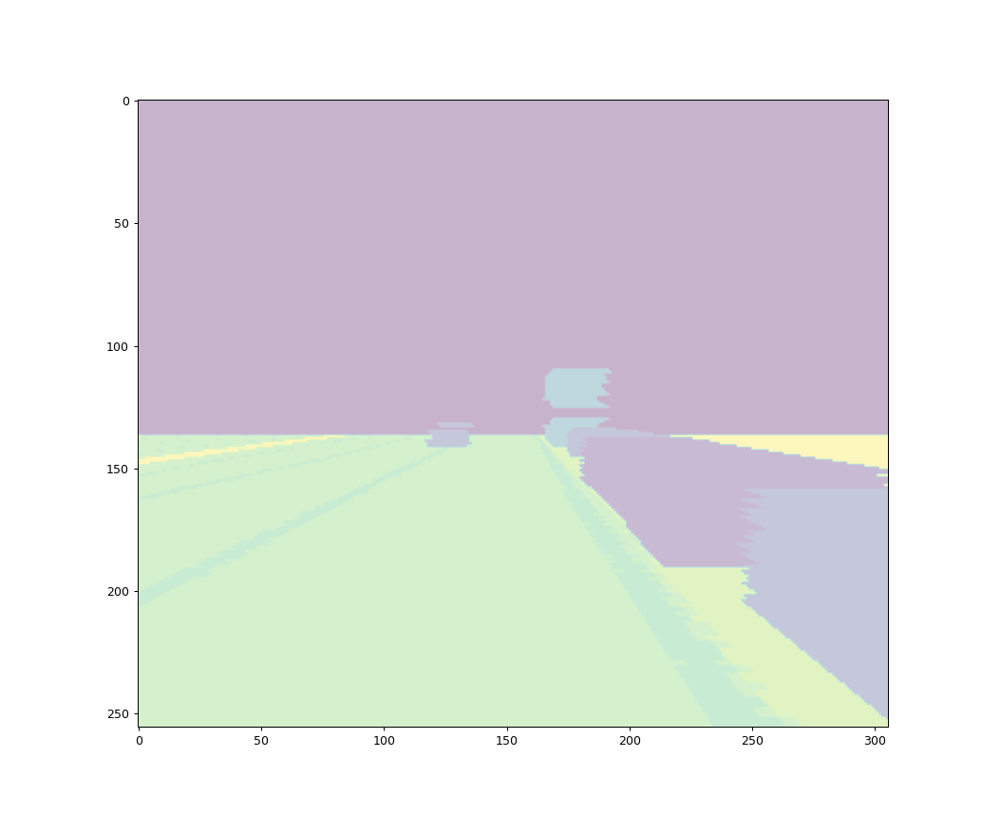

In [595]:
fig, axis = plt.subplots(1, 1)
axis.imshow(segm_hw, alpha=0.3)

In [534]:
%matplotlib notebook

In [529]:
np.unique(segm_hw)

array([-1,  0,  2,  5,  9, 10, 11, 13])

<IPython.core.display.Javascript object>


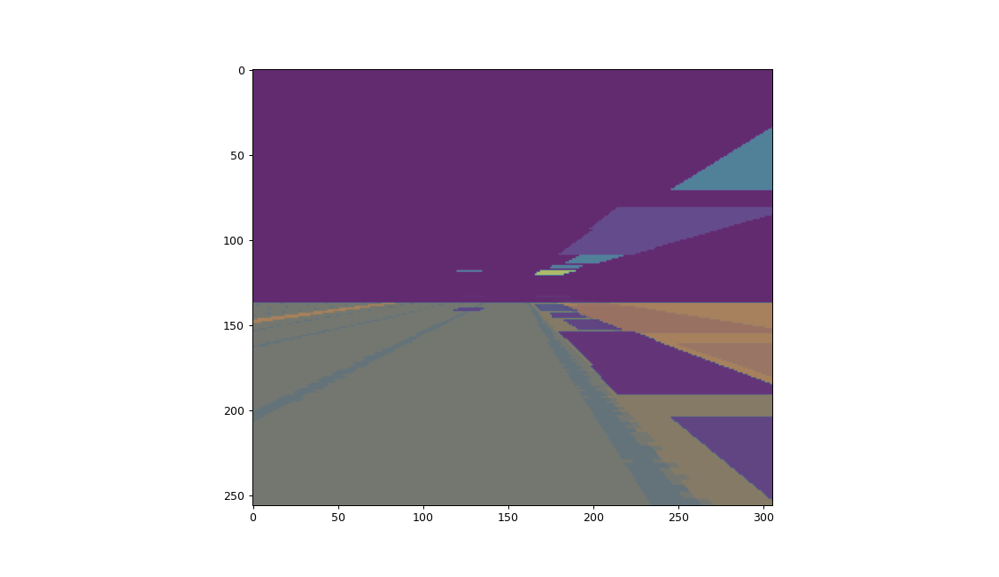

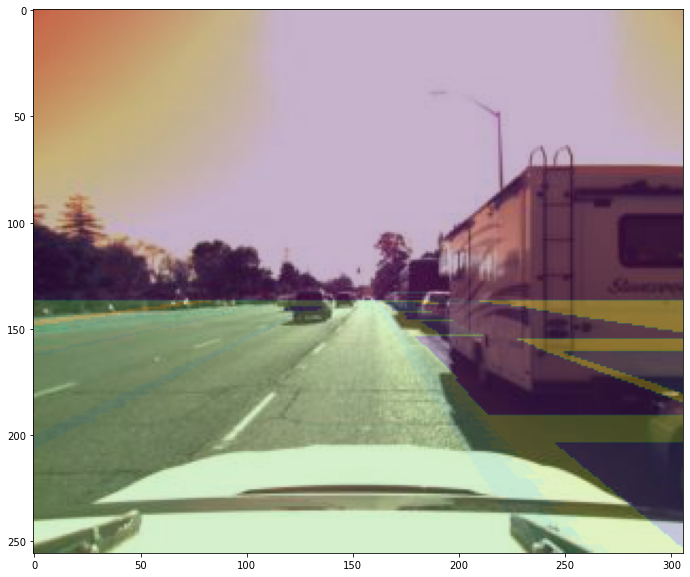

In [526]:
plt.imshow(photo_hw)
plt.imshow(segm_hw, alpha=0.3)
plt.show()

In [445]:
segm_hw

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [10., 10., 10., ...,  9.,  8.,  7.],
       [10., 10., 10., ..., 11., 10.,  8.],
       [10., 10., 10., ..., 11., 11., 10.]])

In [444]:
top_down_segm_WW

array([[13, 13, 13, ..., 13, 13, 13],
       [13, 13, 13, ..., 13, 13, 13],
       [13, 13, 13, ..., 13, 13, 13],
       ...,
       [13, 13, 13, ..., 13, 13, 13],
       [13, 13, 13, ..., 13, 13, 13],
       [13, 13, 13, ..., 13, 13, 13]], dtype=uint8)

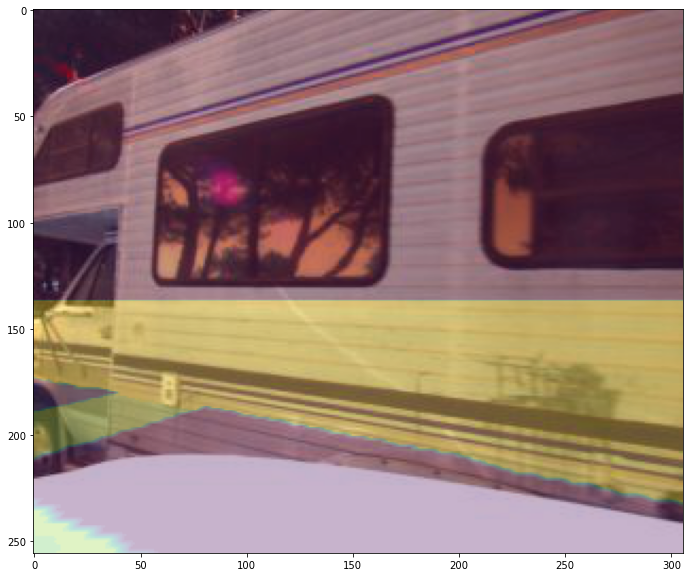

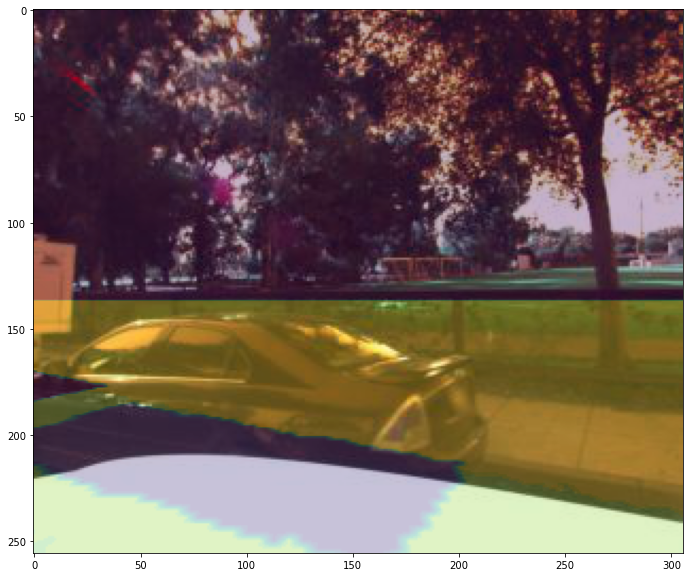

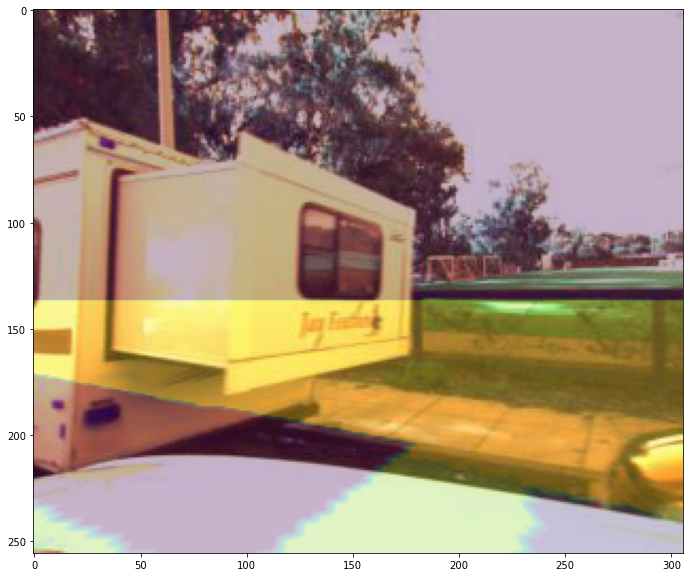

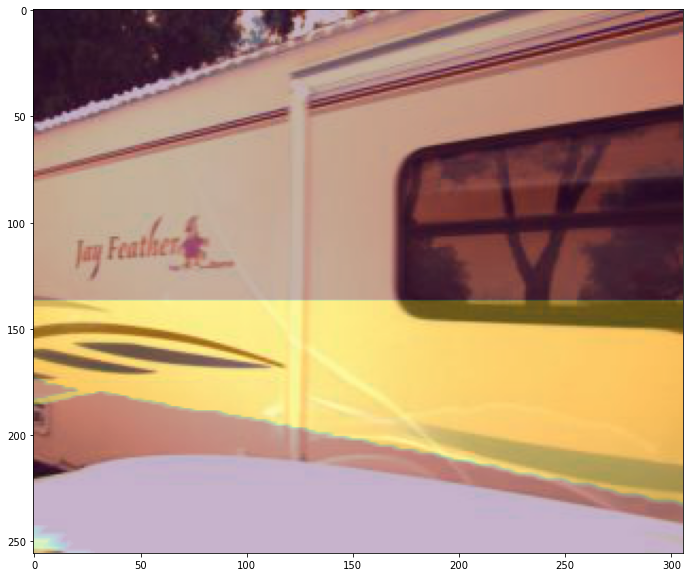

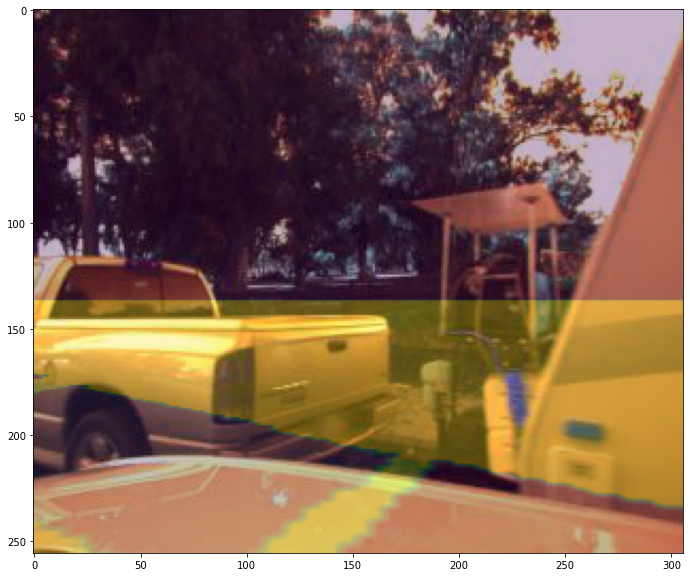

...

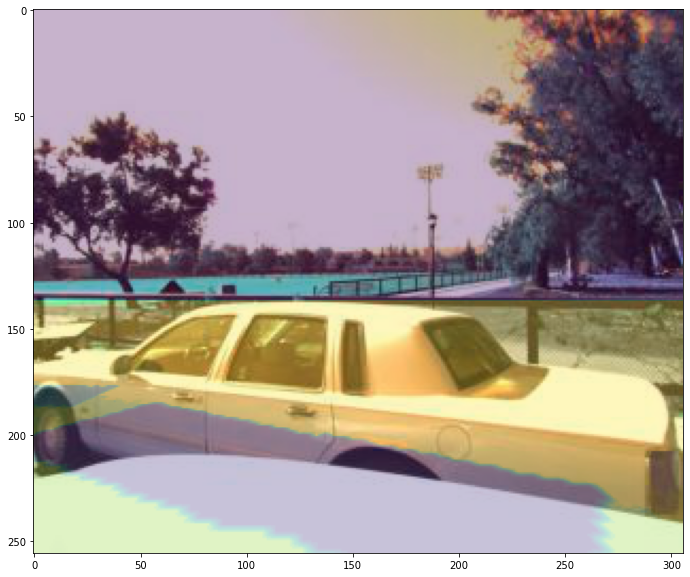

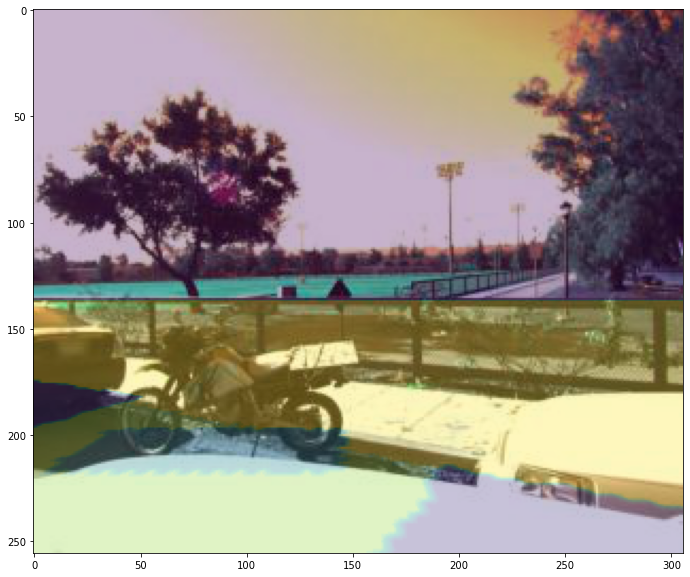

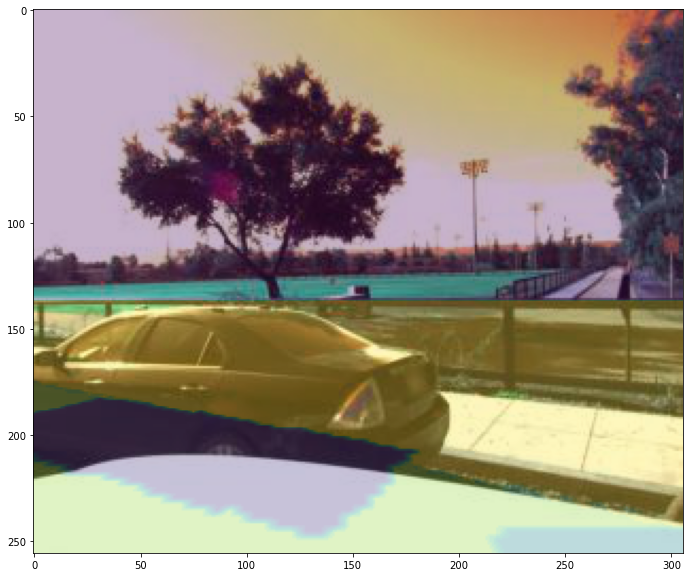

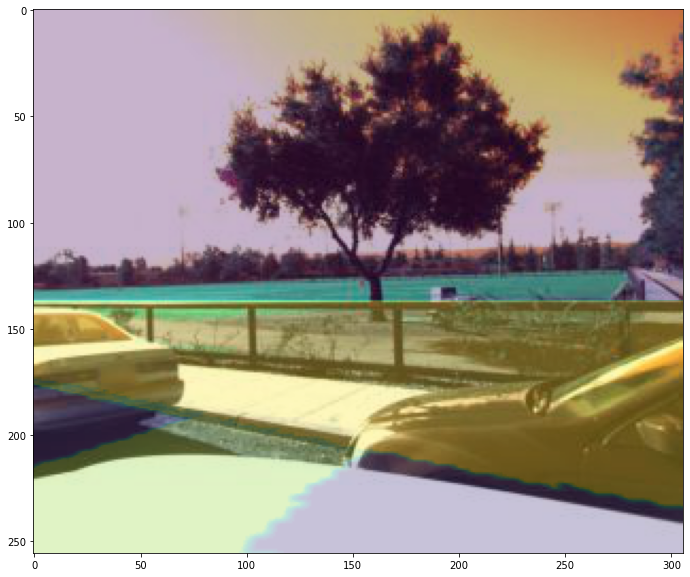

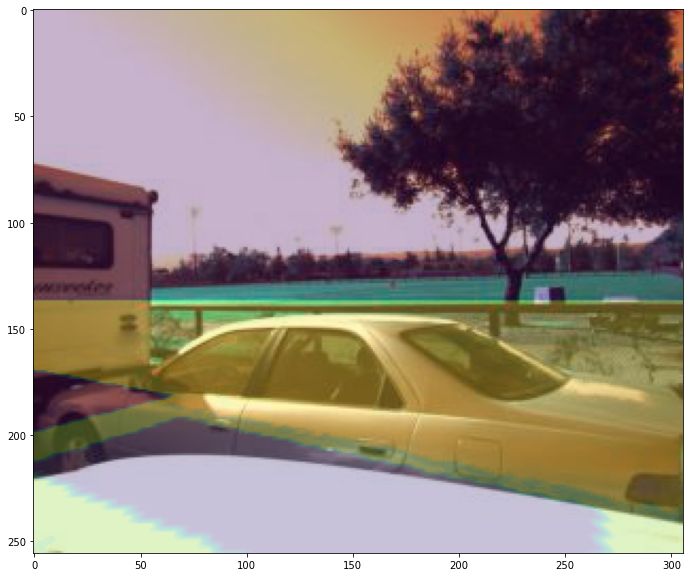

In [433]:
scene_id = 106
for sample_id in range(0, 50, 2):
    for (idx, angle), name in zip(constants.IDX_TO_ANGLE.items(), constants.CAM_NAMES):
        if idx == 2:
#             sample_id = 61
            photo_hw = cv2.imread(f"../data/scene_{scene_id}/sample_{sample_id}/{name}.jpeg", cv2.IMREAD_UNCHANGED)
            mask = cv2.imread(f"../data/scene_{scene_id}/sample_{sample_id}/top_down_segm.png", cv2.IMREAD_UNCHANGED)
        #     mask = np.roll(mask, -10, axis=1)
            segm_hw  = get_warped(rotate_image(mask, -angle))

            plt.imshow(photo_hw)
            plt.imshow(segm_hw, alpha=0.3)
            plt.show()

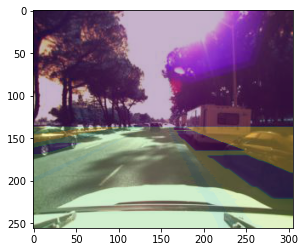

In [ ]:
plt.imshow(photo)
plt.imshow(segm_hw, alpha=0.3)

In [353]:
%matplotlib notebook

<IPython.core.display.Javascript object>


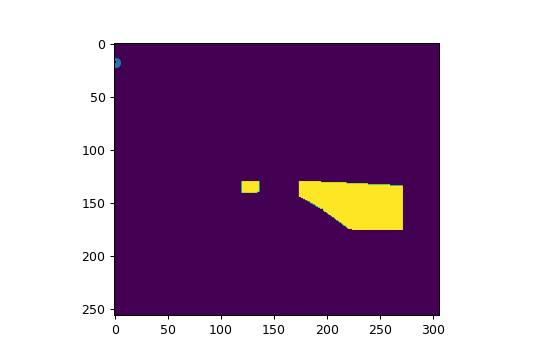

In [230]:
camera_height_in_m = 1.7


corners = Corners(camera_height_in_m=camera_height_in_m, alpha=70, level_height_in_m=50)
photo_corners_43, map_corners_43 = corners.get_photo_and_map_corners()
plt.scatter(photo_corners_43[:, 1], photo_corners_43[:, 2])
plt.hlines(camera_height_in_m * 10, -1, 1)
plt.show()

<IPython.core.display.Javascript object>


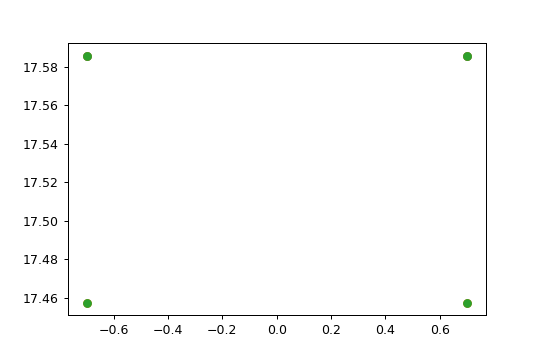

In [204]:
# corners = Corners(camera_height_in_m=1.7, alpha=70)
# photo_corners_43, map_corners_43 = corners.get_photo_and_map_corners()
# plt.scatter(photo_corners_43[:2, 1], photo_corners_43[:2, 2])

corners = Corners(camera_height_in_m=1.7, alpha=70, level_height_in_m=20)
photo_corners_43, map_corners_43 = corners.get_photo_and_map_corners()
plt.scatter(photo_corners_43[:2, 1], photo_corners_43[:2, 2])

plt.show()

# for height in [0., 0.5, 1, 1.5]:
#     corners = Corners(camera_height_in_m=1.7, alpha=70, level_height_in_m=height)
#     photo_corners_43, map_corners_43 = corners.get_photo_and_map_corners()
#     plt.scatter(photo_corners_43[:, 1], photo_corners_43[:, 2], label=height)
    
# plt.legend()
# plt.show()

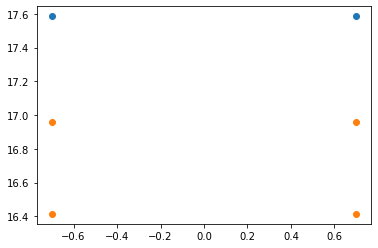

In [133]:
photo_corners_43, map_corners_43

(array([[ 1.        , -0.70020754, 16.41420546],
        [ 1.        ,  0.70020754, 16.41420546],
        [ 1.        , -0.70020754, 16.9575    ],
        [ 1.        ,  0.70020754, 16.9575    ]]),
 array([[  29.02041379,  -20.3203125 ,    0.        ],
        [  29.02041379,   20.3203125 ,    0.        ],
        [ 400.        , -280.08301528,    0.        ],
        [ 400.        ,  280.08301528,    0.        ]]))

In [31]:
xy_N2

array([[410,   0],
       [411,   0],
       [412,   0],
       ...,
       [797, 799],
       [798, 799],
       [799, 799]])

In [32]:
h_slc = slice(None)
w_cls = slice(410, None)


<IPython.core.display.Javascript object>


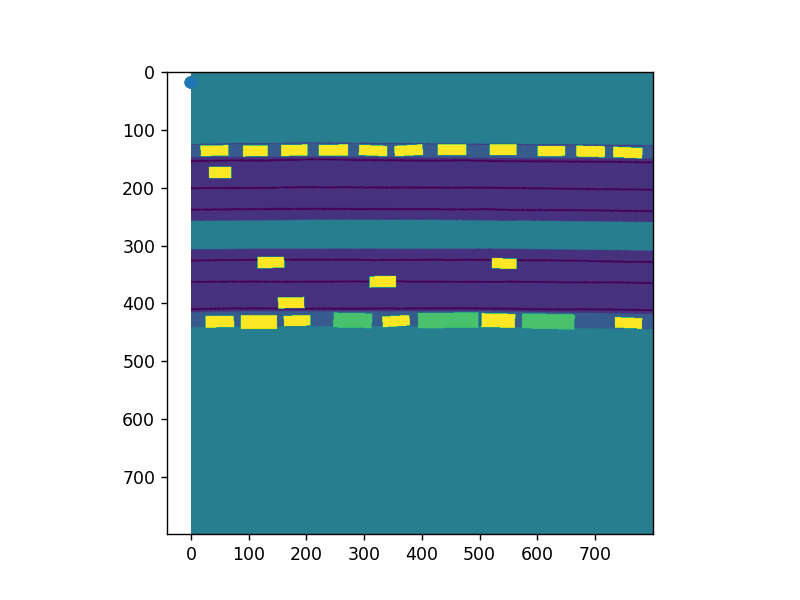

In [43]:
fig, ax = plt.subplots()
ax.imshow(classes_hw);

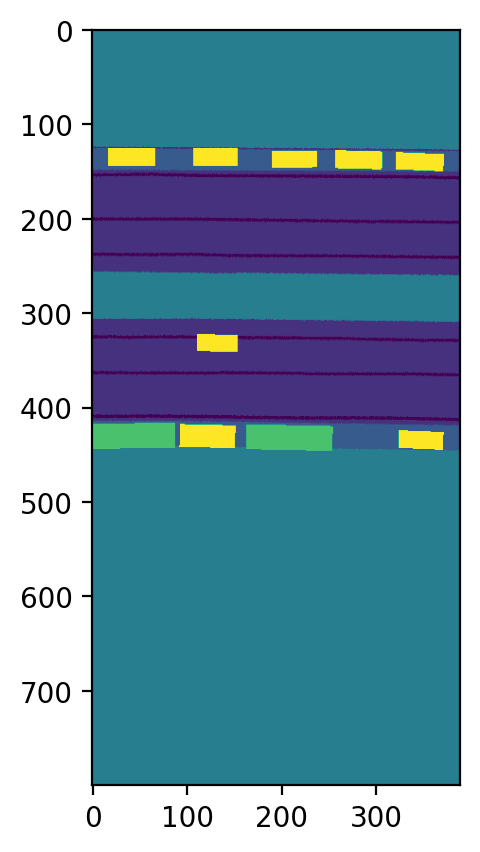

In [33]:
fig, ax = plt.subplots()
ax.imshow(classes_hw[h_slc, w_cls]);

In [34]:
x, y = np.meshgrid(np.arange(n_w)[w_cls], np.arange(n_h)[h_slc])
xy_N2 = np.vstack((x.ravel(), y.ravel())).T

In [35]:
xy_N3 = np.concatenate((xy_N2, np.zeros((xy_N2.shape[0], 1))), axis=-1)

In [36]:
xyz_N3 = f(xy_N3)

In [37]:
%matplotlib notebook

<IPython.core.display.Javascript object>


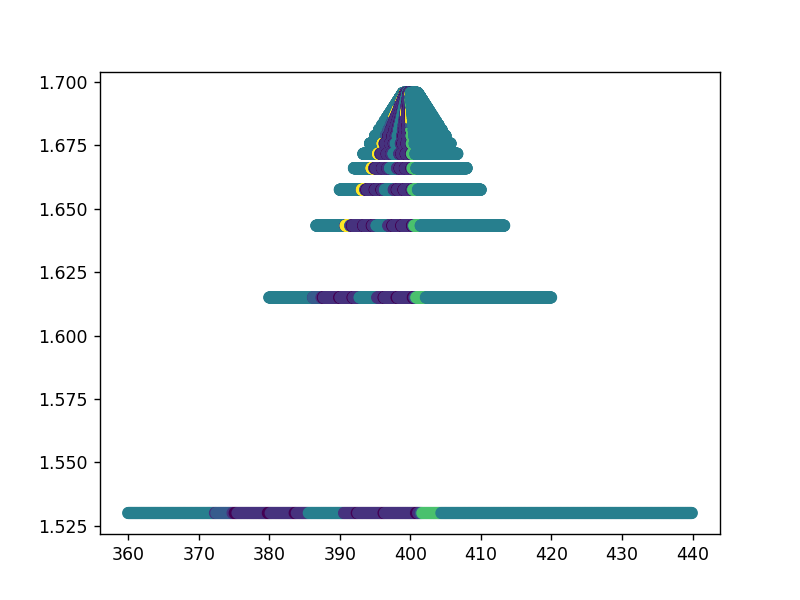

In [38]:
N_slc = slice(None, None, 10)
plt.scatter(xyz_N3[N_slc, 1], xyz_N3[N_slc, 2], 
            c=classes_hw[h_slc, w_cls].ravel()[N_slc])

<IPython.core.display.Javascript object>


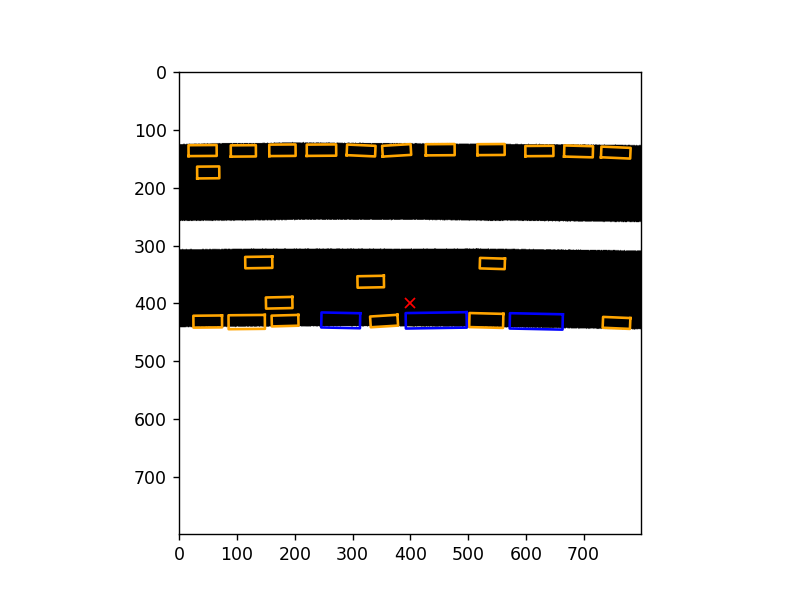

In [42]:
plot_utils.plot_bb(
    road_image, target, 
    b_slc=car_idces
)

# Projections

In [10]:
from importlib import reload

In [11]:
import projections
reload(projections)

<module 'projections' from '/home/marina/Documents/DL/project/ssl_project/projections.py'>

In [13]:
from utils import to_np

In [15]:


# fig, axis = plt.subplots(1, 1)
# plot_utils.plot_bb(
#     road_image, target, 
#     b_slc=car_idces[proj_plane.is_valid(cars_n)],
#     axis=axis
# )

# x = np.linspace(0, 800,100)
# for k in [
# #     np.sqrt(3),   -np.sqrt(3),
#           np.sqrt(1/3), -np.sqrt(1/3), ]:
#     axis.plot(x, 400 + k * (x - 400))
    
# axis.axvline(400)


In [16]:
sample, target, road_image, extra = labeled_trainset[2500]
sample.shape

# boounding box
# (7,8)----------(3,4)
#   |              |
# (5,6)----------(1,2)

cars_n = np.array([
    to_np(target["bounding_box"][car_idx].T)
    for car_idx in range(len(target["bounding_box"]))
])

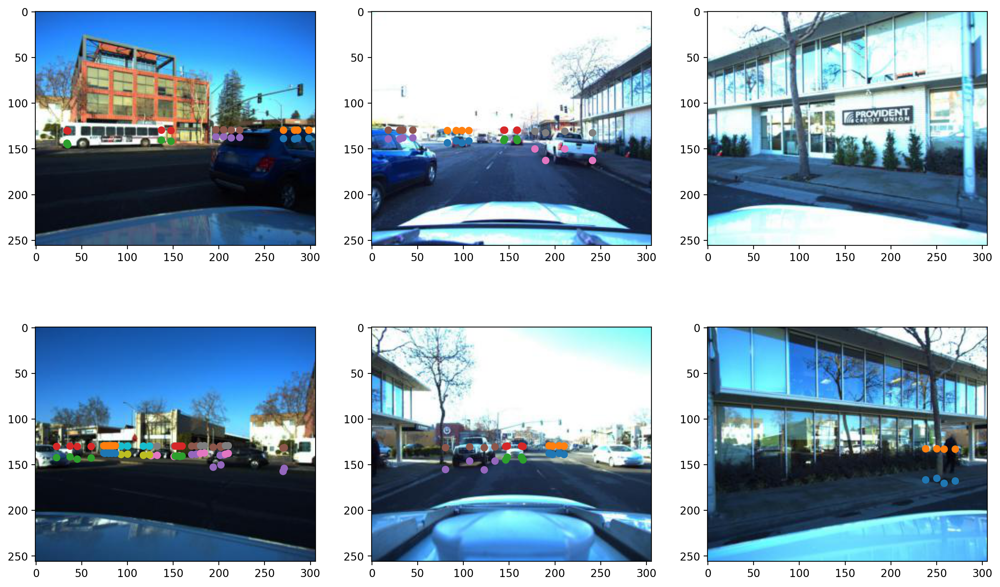

In [17]:
fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

cam_names = ["CAM_FRONT_LEFT", "CAM_FRONT", "CAM_FRONT_RIGHT", "CAM_BACK_LEFT", "CAM_BACK", "CAM_BACK_RIGHT"]
cam_angle = [60,                    0,             -60,           120,            180,          -120]
idx_to_angle = dict(enumerate(cam_angle))

for photo_idx in range(6):
    proj_plane = projections.ProjectionPlane(1.7, 70, idx_to_angle[photo_idx])
    
    axis=axes[photo_idx]

    plot_utils.plot_photos(sample[photo_idx], axis=axis)
    for idx, (valid, yz_42, yz_42_top) in enumerate(zip(proj_plane.is_valid(cars_n),
                                             proj_plane(cars_n), proj_plane(cars_n, 1.5))): # [[0,1,2,4]])):
        if valid:
            axis.scatter(yz_42[:, 0],     yz_42[:, 1], label=idx)
            axis.scatter(yz_42_top[:, 0], yz_42_top[:, 1], label=idx)
